num imgs=5487


(-0.5, 3199.5, 3199.5, -0.5)

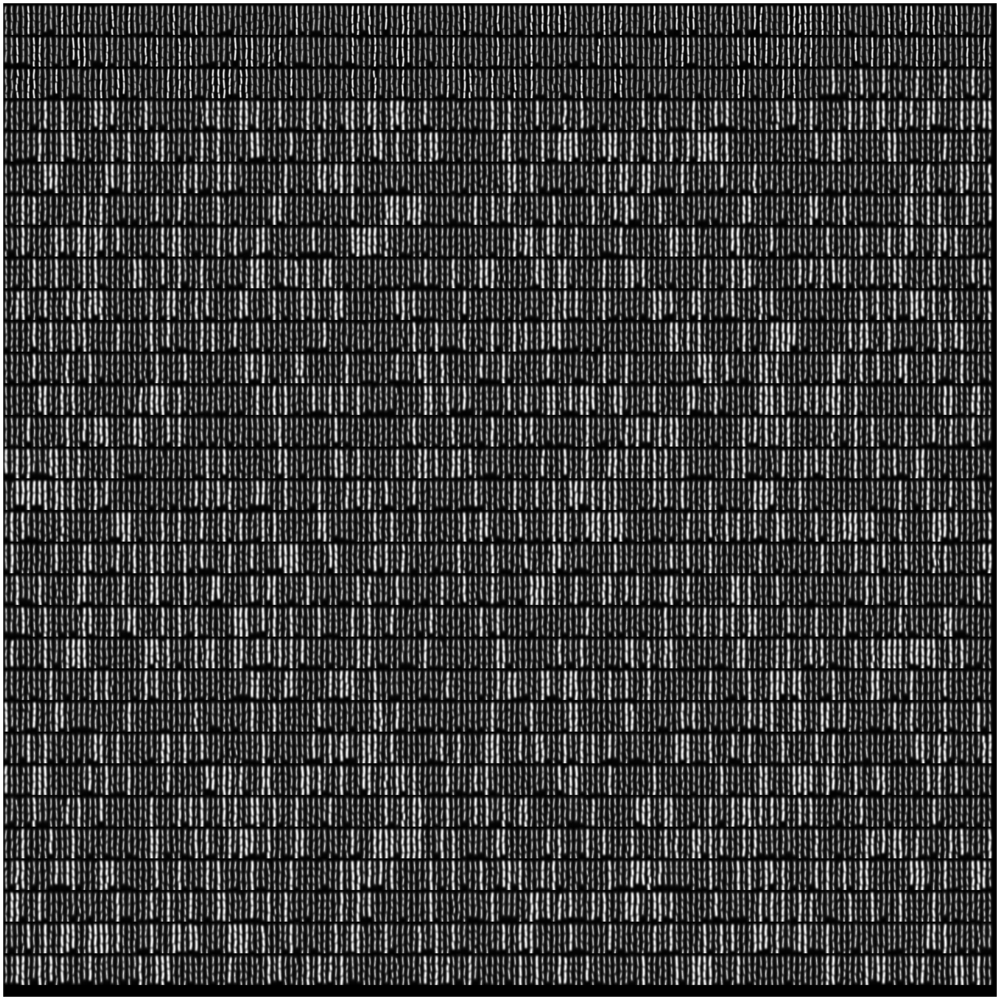

In [10]:
from glob import glob
import matplotlib as mpl
import matplotlib.pyplot as plt
from natsort import natsorted
import numpy as np
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.util import img_as_ubyte
import tifffile

from cellpose import models, core, plot, io, transforms
import omnipose
from omnipose.utils import normalize99


save_dir = "/home/hslab/workspace_python/symbac_pip/testdata/"
model_dir = save_dir + "train/models/"
convs_dir = save_dir + "convolutions/"
test_dir = save_dir + "large/
convs = sorted(glob(convs_dir+"/*"))
first_img = tifffile.imread(convs[0])
img_shape = first_img.shape
evo_shape = (3200, 3200)
#evo_shape = (1000, 60)
num_tiles = (int(evo_shape[0]/img_shape[0]), int(evo_shape[1]/img_shape[1]))
num_imgs = num_tiles[0]*num_tiles[1]
print("num imgs={}".format(num_imgs))
large_img = np.zeros(evo_shape, dtype=np.float64)
for i, fname in enumerate(convs[:num_imgs]):
    irow = int(i/num_tiles[1])
    icol = np.mod(i,num_tiles[1])
    img_i = tifffile.imread(fname)
    img_i = img_i/img_i.max()
    large_img[irow*img_shape[0]:(irow+1)*img_shape[0], icol*img_shape[1]:(icol+1)*img_shape[1]] = img_i

    
fig = plt.figure(figsize=[40]*2) # initialize figure
large_img = normalize99(large_img)
plt.subplot(1,1,1)
plt.imshow(large_img,cmap='gray')
plt.axis('off')

In [11]:
model_list = natsorted(glob(save_dir + "train/models/*"))
model_name = model_list[-1]
print(model_name)
model = models.CellposeModel(gpu=True, pretrained_model=model_name, omni=True, concatenation=True)

chans = [0,0] #this means segment based on first channel, no second channel
mask_threshold = -1
verbose = 0 # turn on if you want to see more output 
transparency = True # transparency in flow output
rescale=None # give this a number if you need to upscale or downscale your images
omni = True # we can turn off Omnipose mask reconstruction, not advised 
flow_threshold = 0. # default is .4, but only needed if there are spurious masks to clean up; slows down output
resample = True #whether or not to run dynamics on rescaled grid or original grid 

/home/hslab/workspace_python/symbac_pip/testdata/train/models/cellpose_residual_on_style_on_concatenation_off_omni_nclasses_4_train_2023_03_28_16_34_18.860782_epoch_801
2023-03-28 18:47:03,094 [INFO] ** TORCH GPU version installed and working. **
2023-03-28 18:47:03,095 [INFO] >>>> using GPU


In [13]:
import time

start = time.perf_counter()
masks, flows, styles = model.eval([large_img],channels=chans,rescale=rescale,mask_threshold=mask_threshold,transparency=transparency,
                                  flow_threshold=flow_threshold,omni=omni,resample=resample,verbose=verbose)
elapsed = time.perf_counter() - start
print("elapsed {}".format(elapsed))

elapsed 14.59506453992799
